# Lab 3 - Feature Extraction and Recognition

In this lab, we are going to explore how to extract and match image features using ORB and SIFT.

We will test these algorithms on photos of NTU's ISTeC and Newton Arkwright buildings, taken at different times of day.

The images are available in this week's NOW Learning Room alongside this Python notebook.

Following the lecture, the goal today is to implement and understand how keypoints are detected, how descriptors are matched, and how recognition can be performed by counting feature matches.

First, let's ensure the correct libraries are installed...

In [2]:
!pip install opencv-python matplotlib numpy

Now that the libraries are installed, let's import them.

In [3]:
print("Importing libraries...")

import cv2
import numpy as np
import matplotlib.pyplot as plt

print("Libraries imported successfully!")

cv2.setRNGSeed(12345)

Importing libraries...
Libraries imported successfully!


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
%cd /content/drive/MyDrive/Second Term NTU/Artificial_Perception/Lecture_3

/content/drive/MyDrive/Second Term NTU/Artificial_Perception/Lecture_3


# **Step 1 - Loading our Images**

Now let's visualise the images...

Do the images look correct?

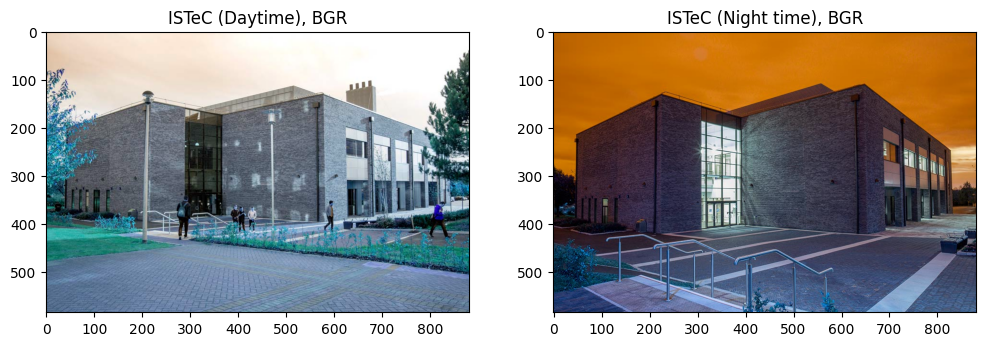

In [6]:
istec_day = cv2.imread("istec_day.jpg")
istec_night = cv2.imread("istec_night.jpg")

fig, axs = plt.subplots(1, 2, figsize=(12, 6))

axs[0].imshow(istec_day)
axs[0].set_title("ISTeC (Daytime), BGR")

axs[1].imshow(istec_night)
axs[1].set_title("ISTeC (Night time), BGR")

plt.show()

The images look **incorrect** because cv2 has loaded them in BGR colour space (blue, green, red). Our pixels are stored as RGB (red, green, blue).

To fix this, we can call the *cvtColor* and *COLOR_BGR2RGB* functions to fix them.

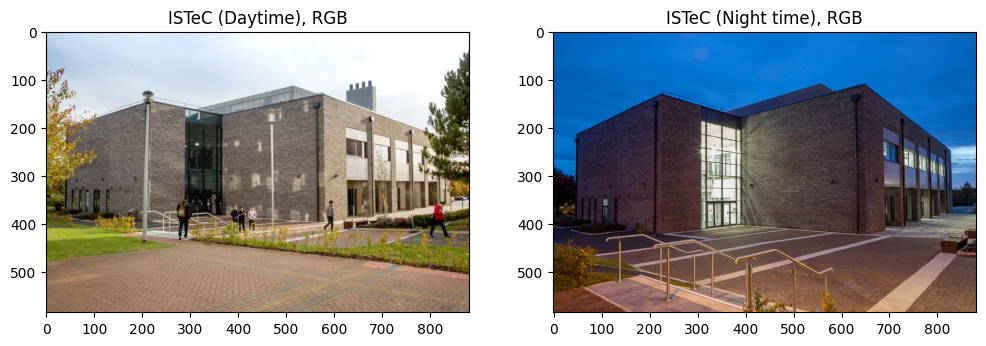

In [7]:
istec_day = cv2.imread("istec_day.jpg")
istec_night = cv2.imread("istec_night.jpg")

istec_day = cv2.cvtColor(istec_day, cv2.COLOR_BGR2RGB)
istec_night = cv2.cvtColor(istec_night, cv2.COLOR_BGR2RGB)

fig, axs = plt.subplots(1, 2, figsize=(12, 6))

axs[0].imshow(istec_day)
axs[0].set_title("ISTeC (Daytime), RGB")

axs[1].imshow(istec_night)
axs[1].set_title("ISTeC (Night time), RGB")

plt.show()

# Point of Reflection

What differences are there in the images? What types of variance can you see?

Refer back to the lecture slides for the types of variance that can exist between images.



# **Step 4 - ORB**

Now we will run the ORB algorithm to detect keypoints from each image.

We will try detecting 5000 keypoints from each image.

Text(0.5, 1.0, 'ISTeC keypoints (Night time)')

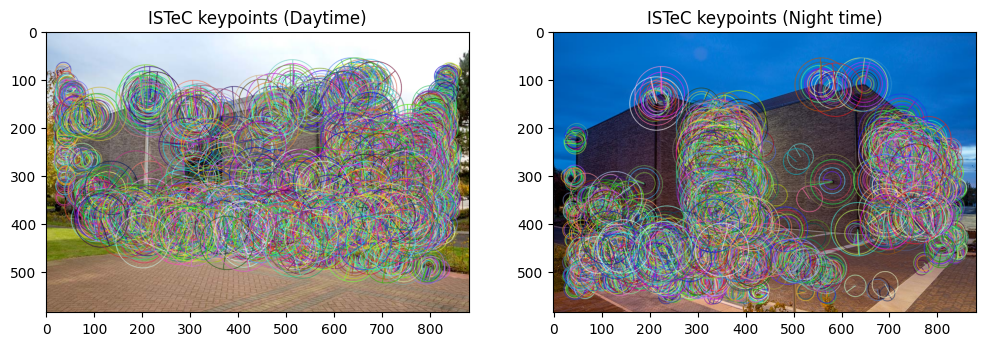

In [8]:
orb = cv2.ORB_create(nfeatures=5000)

kp_day, des_day = orb.detectAndCompute(istec_day, None)
kp_night, des_night = orb.detectAndCompute(istec_night, None)

img_day_kp = cv2.drawKeypoints(istec_day, kp_day, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img_night_kp = cv2.drawKeypoints(istec_night, kp_night, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

fig, axs = plt.subplots(1, 2, figsize=(12, 6))

axs[0].imshow(img_day_kp)
axs[0].set_title(f"ISTeC keypoints (Daytime)")

axs[1].imshow(img_night_kp)
axs[1].set_title(f"ISTeC keypoints (Night time)")

# Step 4.1 - ORB Keypoint Matches

Given our ORB keypoints, let's now measure the hamming distance between them and see the top 50 keypoints that were detected.

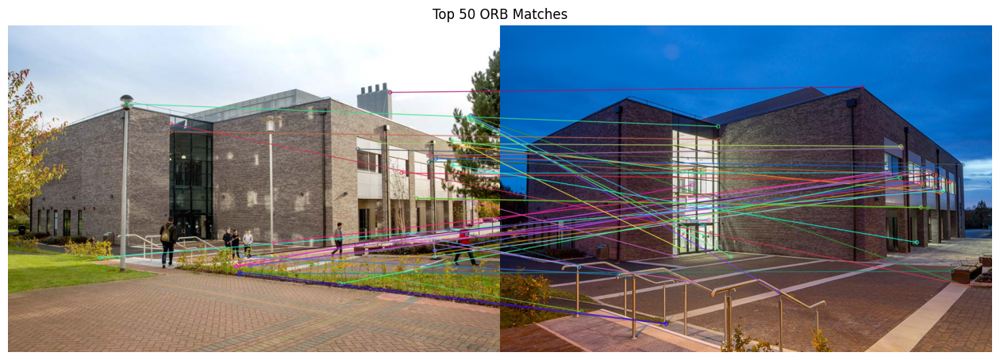

In [9]:
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des_day, des_night)
matches = sorted(matches, key=lambda x: x.distance)

img_matches = cv2.drawMatches(istec_day, kp_day, istec_night, kp_night, matches[:50], None, flags=2)

plt.figure(figsize=(16, 8))
plt.imshow(img_matches)
plt.title("Top 50 ORB Matches")
plt.axis("off")
plt.show()

# Step 4.2 - ORB with RANSAC

Let's try to improve ORB by using the RANSAC algorithm.

Point of reflection - the below algorithm **fails**. Why might this be? Consider the types of invariance that ORB poorly performs with.

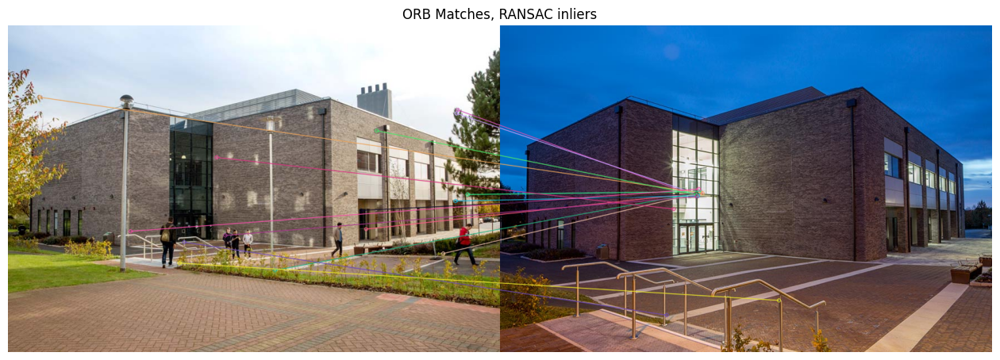

In [10]:
pts_day = np.float32([kp_day[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
pts_night = np.float32([kp_night[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

H, mask = cv2.findHomography(pts_day, pts_night, cv2.RANSAC, 5.0)
matches_mask = mask.ravel().tolist()

inlier_matches = [m for i, m in enumerate(matches) if matches_mask[i]]
img_inliers = cv2.drawMatches(istec_day, kp_day, istec_night, kp_night, inlier_matches, None, flags=2)

plt.figure(figsize=(16, 8))
plt.imshow(img_inliers)
plt.title(f"ORB Matches, RANSAC inliers")
plt.axis("off")
plt.show()

# Step 5 - SIFT

Let's try SIFT on the exact same task. SIFT uses gradient orientations, which are more robust to illumination variance.

There were  3589  keypoints detected for ISTeC (Daytime)
There were  1739  keypoints detected for ISTeC (Night time)


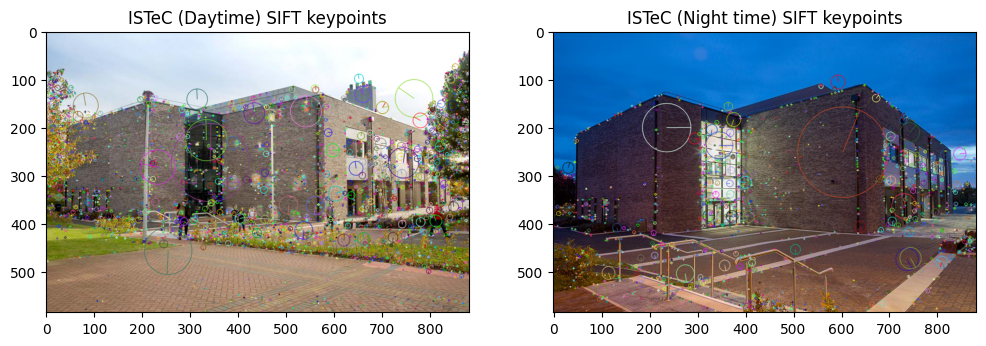

In [11]:
sift = cv2.SIFT_create()

kp_day_sift, des_day_sift = sift.detectAndCompute(istec_day, None) # this function returns keypoints (kp) and descriptors (des)
kp_night_sift, des_night_sift = sift.detectAndCompute(istec_night, None)

img_day_sift = cv2.drawKeypoints(istec_day, kp_day_sift, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img_night_sift = cv2.drawKeypoints(istec_night, kp_night_sift, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

print("There were ", len(kp_day_sift), " keypoints detected for ISTeC (Daytime)")
print("There were ", len(kp_night_sift), " keypoints detected for ISTeC (Night time)")

fig, axs = plt.subplots(1, 2, figsize=(12, 6))

axs[0].imshow(img_day_sift)
axs[0].set_title(f"ISTeC (Daytime) SIFT keypoints")

axs[1].imshow(img_night_sift)
axs[1].set_title(f"ISTeC (Night time) SIFT keypoints")

plt.show()

# Point of Reflection
Compare the SIFT and ORB keypoints, do they appear in the same regions? Do you notice more keypoints in textured and/or illuminated areas?

# Step 5.1 SIFT with FLANN

ORB required us to use RANSAC due to the binary nature of the descriptors. We can also do this with SIFT features, but SIFT is most commonly used with FLANN.

There were 23 good matches!


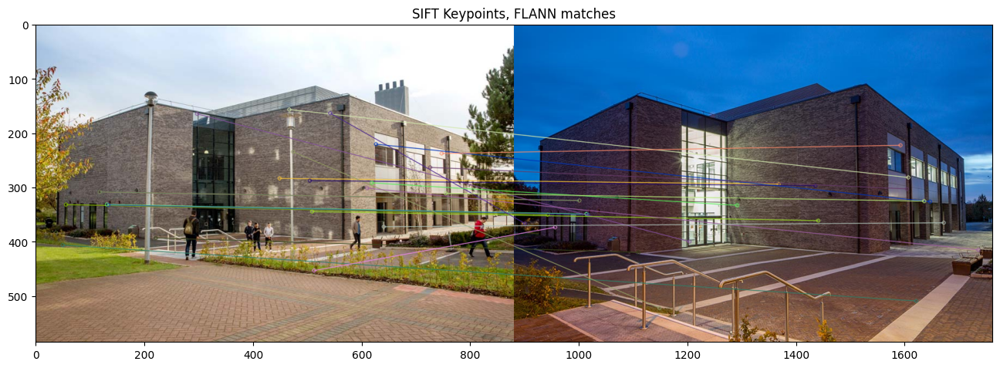

In [12]:
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)

flann = cv2.FlannBasedMatcher(index_params, search_params)

matches_sift = flann.knnMatch(des_day_sift, des_night_sift, k=2)

good_matches = []
for m, n in matches_sift:
    if m.distance < 0.7 * n.distance:
        good_matches.append(m)

print("There were", len(good_matches), "good matches!")

img_sift_matches = cv2.drawMatches(istec_day, kp_day_sift, istec_night, kp_night_sift, good_matches, None, flags=2)

plt.figure(figsize=(16, 8))
plt.imshow(img_sift_matches)
plt.title(f"SIFT Keypoints, FLANN matches")
plt.show()

**Much better!** In the above image, we can see that there are more keypoints that line up between the two images. Especially the windows on both sides of the image.

The main entrance still fails to match. This means the variance was too extreme, even for SIFT. What type of variance can you see between the main entrance on the two images?

# Comparing the two approaches
We will now compare our two approaches (ORB + RANSAC) vs. (SIFT + FLANN)

ORB Results
ORB keypoints (day): 4975
ORB keypoints (night):  4465
Number of ORB matches: 1155


SIFT Results
SIFT keypoints (day): 3589
SIFT keypoints (night): 1739
Number of SIFT good matches:  23


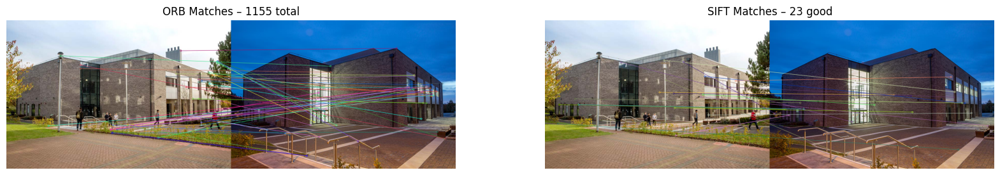

In [13]:
print("ORB Results")
print("ORB keypoints (day):", len(kp_day))
print("ORB keypoints (night): ", len(kp_night))
print("Number of ORB matches:", len(matches))
print("\n")
print("SIFT Results")
print("SIFT keypoints (day):", len(kp_day_sift))
print("SIFT keypoints (night):", len(kp_night_sift))
print("Number of SIFT good matches: ", len(good_matches))

fig, axs = plt.subplots(1, 2, figsize=(20, 10))

axs[0].imshow(img_matches)
axs[0].set_title(f"ORB Matches – {len(matches)} total")
axs[0].axis("off")

axs[1].imshow(img_sift_matches)
axs[1].set_title(f"SIFT Matches – {len(good_matches)} good")
axs[1].axis("off")

plt.show()

# Lab Challenge 1 - **Perceiving** which Building is in the Image

Your challenge today is to fix the below code.

**What should this code do?** - This code is going to take our image of the ISTeC building in the day time as a query image. That image is going to be queried against keypoint matches from two images - 1) the ISTeC building at night and 2) the Newton building in the day time.

We will then count the number of matches between the query and the other two images. The image with the most amount of matches will be chosen.

That is, we will use **artificial perception** to recognise which building the image contains.

**Note** - if you are unsure, scroll up to see how the required tasks were completed on the other images.

---

**Tasks for you to complete**

You have three main tasks to complete in the below code (see the code comments for where):
1.   Load the image provided in the NOW Learning Room (newton-arkwright_day.jpg)
2.   Switch the image from BGR to RGB colour space
3.   Run SIFT on the new image
When you have completed the above tasks, run the code and see which was the best match.

**Note** - the code **will crash** until all three tasks are completed. However, once Tasks 1 and 2 are completed, you should see an image of the Newton building displayed on screen before it crashes.

**Point of reflection** - when you are finished, which building was matched? Was it the correct one?



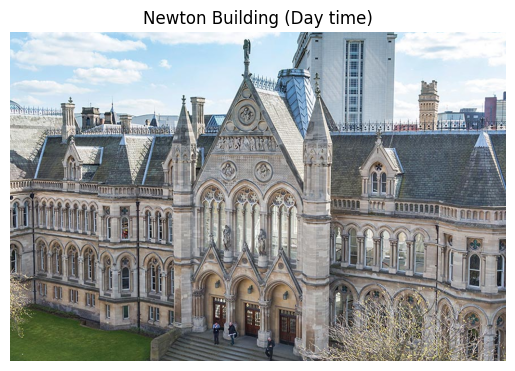

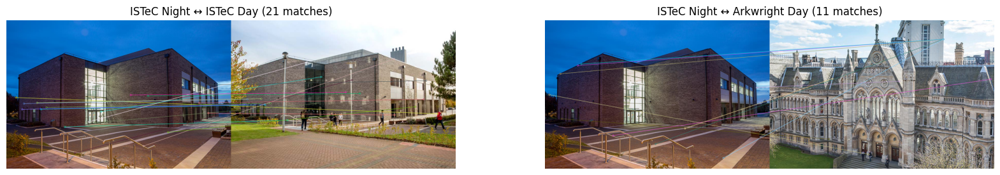

The best match to this query is: "istec_day.jpg"


In [14]:
# Loading the image
arkwright = cv2.imread("newton-arkwright_day.jpg") # TASK 1 - Load the image of the Newton building here

arkwright = cv2.cvtColor(arkwright, cv2.COLOR_BGR2RGB) # TASK 2 - Switch the Newton building image from BGR to RGB

plt.imshow(arkwright)
plt.title("Newton Building (Day time)")
plt.axis("off")
plt.show()

sift = cv2.SIFT_create()
kp_arkwright, des_arkwright = sift.detectAndCompute(arkwright, None) # TASK 3 - fix this line of code, use SIFT's detect and compute function on the image of the Newton building

# Function for matching query to the images - completed for you
def match_images(desc1, desc2, kp1, kp2, img1, img2):
    matches = flann.knnMatch(desc1, desc2, k=2)
    good = []
    for m, n in matches:
        if m.distance < 0.7 * n.distance:
            good.append(m)
    result_img = cv2.drawMatches(img1, kp1, img2, kp2, good[:50], None, flags=2)
    return good, result_img

# Calculate the matches - completed for you
matches_istec, img_istec_match = match_images(des_night_sift, des_day_sift, kp_night_sift, kp_day_sift, istec_night, istec_day)
matches_arkwright, img_arkwright_match = match_images(des_night_sift, des_arkwright, kp_night_sift, kp_arkwright, istec_night, arkwright)
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
axs[0].imshow(img_istec_match); axs[0].set_title(f"ISTeC Night ↔ ISTeC Day ({len(matches_istec)} matches)"); axs[0].axis("off")
axs[1].imshow(img_arkwright_match); axs[1].set_title(f"ISTeC Night ↔ Arkwright Day ({len(matches_arkwright)} matches)"); axs[1].axis("off")
plt.show()


# Decide which image matches best by choosing the one with the most matches - completed for you
if len(matches_istec) > len(matches_arkwright):
    print('The best match to this query is: "istec_day.jpg"')
else:
    print('The best match to this query is: "newton-arkwright_day.jpg"')


# Lab Challenge 2 - Your own Recognition Task

You have now seen how feature extraction and matching can be applied to buildings from the Clifton and City campuses. For this next challenge, you will design your own experiment.

**Your Task**
1.   Find (or capture!) two or more images of the same object, scene, or landmark under different conditions. For example, a different angle, lighting, or partial occlusion.

Example ideas:
*   A building photographed under two different zoom levels
*   A logo or sign on two different buildings (such as a bank)
*   A small object (e.g., a book, mug, or your laptop) in different lighting conditions.
*   A road sign from different distances
2.   Use ORB+RANSAC or SIFT+FLANN to extract features and match them.
3.   Visualise your matches as we did in the above code.
4.   Reflect on whether the algorithm accurately recognise that the images were of the same object.

**Stretch ideas**
1.   Once you are confident with extracting and matching keypoints on the same object, try to introduce a new image (like we did with the Newton building). Can the algorithm distinguish between them?
2.   Try editing the image, such as adding a filter or cropping it. Can the algorithm still match the object?

**Final Reflection**

Today, we have seen the potential usefulness of handcrafted features in image matching, but have also seen that they break easily. Next week, we will move on to deep learning which overcomes many of these issues by learning features automatically.







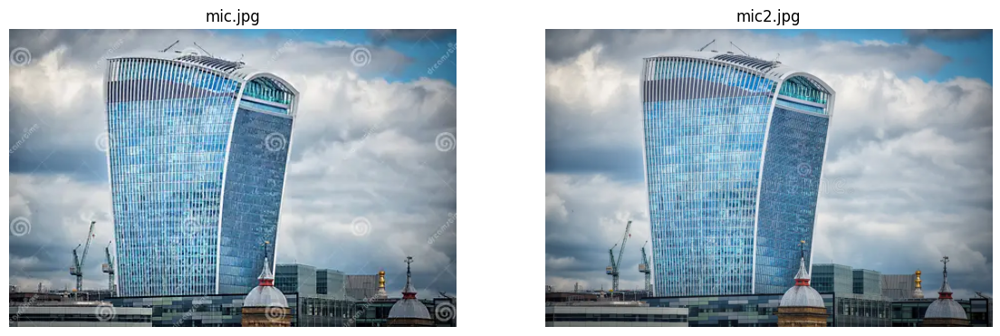

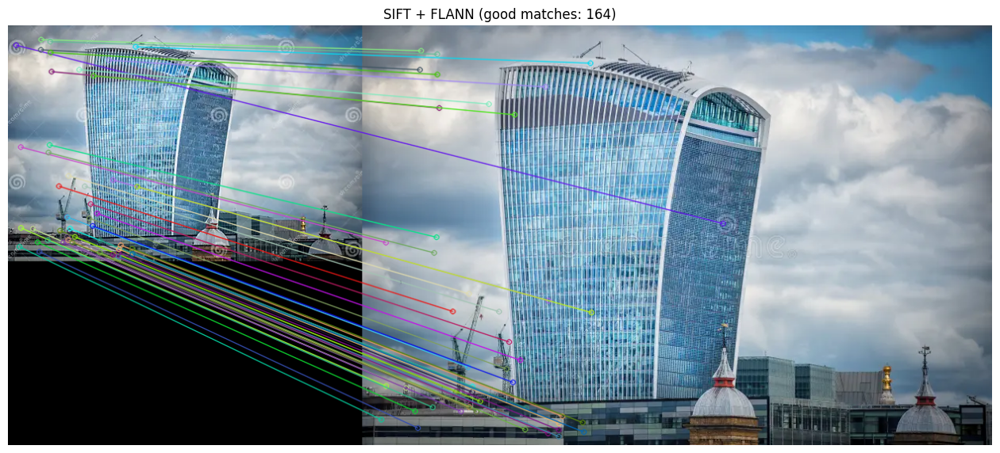

[SIFT] Good matches: 164


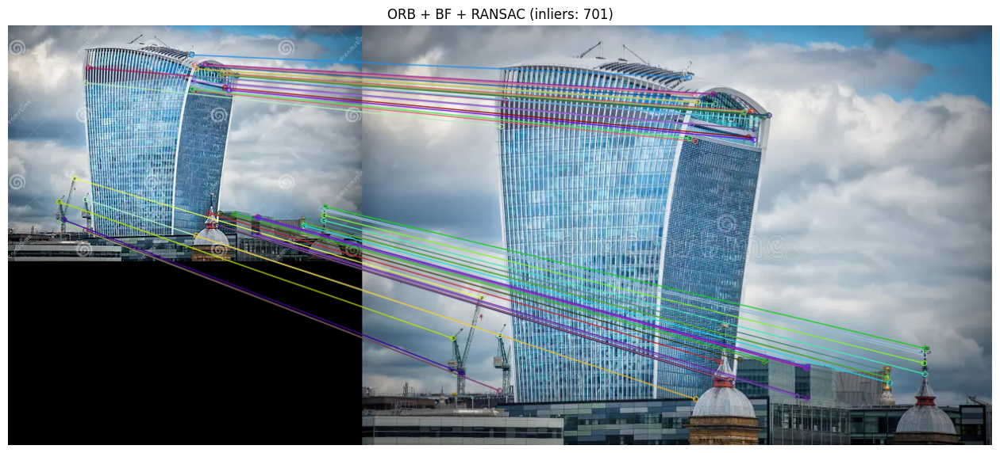

[ORB] Raw matches: 957 | RANSAC inliers: 701

Reflection prompts:
- Do the SIFT good matches concentrate on stable, textured regions of the mic?
- Did RANSAC keep only geometrically consistent ORB matches?
- Which pipeline gave more reliable correspondences given your lighting/angle differences?


In [15]:
# Lab Challenge 2 – Mic images
# Methods used ONLY from the lab:
#   SIFT + FLANN + Lowe ratio
#   ORB + BF(Hamming) + RANSAC

import cv2
import numpy as np
import matplotlib.pyplot as plt

# 1) Load and display images

imgA = cv2.imread("mic.jpg")
imgB = cv2.imread("mic2.jpg")
if imgA is None or imgB is None:
    raise FileNotFoundError("Could not load mic.jpg or mic2.jpg. Check file names/paths.")

# Convert BGR→RGB (as done in lab)
imgA = cv2.cvtColor(imgA, cv2.COLOR_BGR2RGB)
imgB = cv2.cvtColor(imgB, cv2.COLOR_BGR2RGB)

fig, axs = plt.subplots(1, 2, figsize=(14, 7))
axs[0].imshow(imgA); axs[0].set_title("mic.jpg"); axs[0].axis("off")
axs[1].imshow(imgB); axs[1].set_title("mic2.jpg"); axs[1].axis("off")
plt.show()

# 2) SIFT + FLANN (per lab)
# SIFT keypoints and descriptors
sift = cv2.SIFT_create()  # Lab uses SIFT for robustness
kpA_sift, desA_sift = sift.detectAndCompute(imgA, None)
kpB_sift, desB_sift = sift.detectAndCompute(imgB, None)

# FLANN params for SIFT (KD-Tree), Lowe's ratio 0.7 (as in lab)
FLANN_INDEX_KDTREE = 1
index_params  = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params, search_params)

good_sift = []
if desA_sift is not None and desB_sift is not None:
    knn = flann.knnMatch(desA_sift, desB_sift, k=2)
    for m, n in knn:
        if m.distance < 0.7 * n.distance:  # Lowe's ratio test (lab)
            good_sift.append(m)

img_sift_matches = cv2.drawMatches(
    imgA, kpA_sift, imgB, kpB_sift, good_sift[:50], None, flags=2
)
plt.figure(figsize=(16, 8))
plt.imshow(img_sift_matches)
plt.title(f"SIFT + FLANN (good matches: {len(good_sift)})")
plt.axis("off")
plt.show()

print(f"[SIFT] Good matches: {len(good_sift)}")

# 3) ORB + BF(Hamming) + RANSAC (per lab)

# ORB keypoints and descriptors
orb = cv2.ORB_create(nfeatures=3000)
kpA_orb, desA_orb = orb.detectAndCompute(imgA, None)
kpB_orb, desB_orb = orb.detectAndCompute(imgB, None)

# Brute Force matcher with Hamming (lab)
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

matches_orb = []
if desA_orb is not None and desB_orb is not None:
    matches_orb = bf.match(desA_orb, desB_orb)
    matches_orb = sorted(matches_orb, key=lambda x: x.distance)

# (Optional in lab) RANSAC to keep inliers only
inlier_matches = []
if len(matches_orb) >= 4:
    ptsA = np.float32([kpA_orb[m.queryIdx].pt for m in matches_orb]).reshape(-1, 1, 2)
    ptsB = np.float32([kpB_orb[m.trainIdx].pt for m in matches_orb]).reshape(-1, 1, 2)

    H, mask = cv2.findHomography(ptsA, ptsB, cv2.RANSAC, 5.0)  # 5 px threshold (lab)
    if mask is not None:
        mask = mask.ravel().astype(bool)
        inlier_matches = [m for m, keep in zip(matches_orb, mask) if keep]

# Visualise ORB matches (RANSAC inliers if available, else raw top-50)
to_draw = inlier_matches if len(inlier_matches) > 0 else matches_orb
title = (
    f"ORB + BF + RANSAC (inliers: {len(inlier_matches)})"
    if len(inlier_matches) > 0
    else f"ORB + BF (matches: {len(matches_orb)})"
)
img_orb_matches = cv2.drawMatches(imgA, kpA_orb, imgB, kpB_orb, to_draw[:50], None, flags=2)
plt.figure(figsize=(16, 8))
plt.imshow(img_orb_matches)
plt.title(title)
plt.axis("off")
plt.show()

if len(inlier_matches) > 0:
    print(f"[ORB] Raw matches: {len(matches_orb)} | RANSAC inliers: {len(inlier_matches)}")
else:
    print(f"[ORB] Raw matches: {len(matches_orb)} | RANSAC inliers: 0 (no homography found)")

# -----------------------------
# 4) Simple takeaways for your reflection
# -----------------------------
print("\nReflection prompts:")
print("- Do the SIFT good matches concentrate on stable, textured regions of the mic?")
print("- Did RANSAC keep only geometrically consistent ORB matches?")
print("- Which pipeline gave more reliable correspondences given your lighting/angle differences?")